# Important Packages:

In [20]:
import nltk
from urllib.request import urlopen
from bs4 import BeautifulSoup
import requests
import urllib
from nltk.corpus import PlaintextCorpusReader
import pandas as pd
import urllib.request
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.metrics import silhouette_samples,silhouette_score
from array import *
from nltk.probability import FreqDist
import squarify
from itertools import chain
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import random
import pickle
from yellowbrick.cluster import KElbowVisualizer
import pysentiment2 as ps
from nrclex import NRCLex
from nltk.corpus import sentiwordnet as swn
from nltk import pos_tag
from nltk import map_tag
import ssl
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# URL Collection:

In [21]:
rbi_press_release_url = []
for i in range(46688,52476,1):
    url = 'https://www.rbi.org.in/Scripts/BS_PressReleaseDisplay.aspx?prid=' + str(i)
    rbi_press_release_url.append(url)

# Dataframe Initialization:

In [17]:
rbi_press_release = pd.DataFrame()
rbi_press_release['urls'] = rbi_press_release_url
rbi_press_release['content'] = "will be filled"

# RBI Press Releases Scraping (April 2019 - till date):

In [22]:
content=[]
for i in range(0,len(rbi_press_release_url),1):
    weburl  = urllib.request.urlopen(rbi_press_release_url[i])
    htmlparse = BeautifulSoup(weburl.read(), 'html.parser')
    for para in htmlparse.find_all("td"):
        raw = para.get_text()
        content.append(raw)
    rbi_press_release.at[i,"content"] = content
    content = []
    print('Row',i)

Row 0
Row 1
Row 2
Row 3
Row 4
Row 5
Row 6
Row 7
Row 8
Row 9
Row 10
Row 11
Row 12
Row 13
Row 14
Row 15
Row 16
Row 17
Row 18
Row 19
Row 20
Row 21
Row 22
Row 23
Row 24
Row 25
Row 26
Row 27
Row 28
Row 29
Row 30
Row 31
Row 32
Row 33
Row 34
Row 35
Row 36
Row 37
Row 38
Row 39
Row 40
Row 41
Row 42
Row 43
Row 44
Row 45
Row 46
Row 47
Row 48
Row 49
Row 50
Row 51
Row 52
Row 53
Row 54
Row 55
Row 56
Row 57
Row 58
Row 59
Row 60
Row 61
Row 62
Row 63
Row 64
Row 65
Row 66
Row 67
Row 68
Row 69
Row 70
Row 71
Row 72
Row 73
Row 74
Row 75
Row 76
Row 77
Row 78
Row 79
Row 80
Row 81
Row 82
Row 83
Row 84
Row 85
Row 86
Row 87
Row 88
Row 89
Row 90
Row 91
Row 92
Row 93
Row 94
Row 95
Row 96
Row 97
Row 98
Row 99
Row 100
Row 101
Row 102
Row 103
Row 104
Row 105
Row 106
Row 107
Row 108
Row 109
Row 110
Row 111
Row 112
Row 113
Row 114
Row 115
Row 116
Row 117
Row 118
Row 119
Row 120
Row 121
Row 122
Row 123
Row 124
Row 125
Row 126
Row 127
Row 128
Row 129
Row 130
Row 131
Row 132
Row 133
Row 134
Row 135
Row 136
Row 137
Row 13

# Date Extraction:

In [23]:
rbi_press_release['date'] = "will be filled"
for i in range(0,len(rbi_press_release),1):
    rbi_press_release.loc[i,'date'] = rbi_press_release['content'][i][1]

# Title Extraction:

In [24]:
rbi_press_release['title'] = "will be filled"
for i in range(0,len(rbi_press_release),1):
    rbi_press_release.loc[i,'title'] = rbi_press_release['content'][i][2]

# Relevant Content Extraction:

In [25]:
rbi_press_release['updated_content'] = "will be filled"
for i in range(0,len(rbi_press_release),1):
    rbi_press_release.loc[i,'updated_content'] = rbi_press_release["content"][i][3:4:1]

# Date Column Cleaning:

In [26]:
def clean_date(text):
    text_clean = text.replace('Date :', '')
    return text_clean

rbi_press_release['date'] = rbi_press_release['date'].apply(lambda x: clean_date(x))

# Content Cleaning:

In [28]:
def clean(text):
    # text_clean = ' '.join(text)
    text_clean = text
    text_clean = text_clean.replace('\xa0', ' ')
    text_clean = text_clean.replace('\r', ' ')
    text_clean = text_clean.replace('\n', ' ')
    return text_clean

rbi_press_release['content_clean'] = rbi_press_release['updated_content'].apply(lambda x: clean(x))

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...


# Punctuation Cleaning:

In [29]:
def remove_punct(text):
    text_nopunct = "".join([char for char in text if char not in string.punctuation])
    return text_nopunct

rbi_press_release['content_clean'] = rbi_press_release['content_clean'].apply(lambda x: remove_punct(x))

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...


# Tokenization:

In [30]:
rbi_press_release['content_tokenized'] = rbi_press_release['content_clean'].apply(lambda x: nltk.word_tokenize(x.lower()))
rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean,content_tokenized
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...,"[the, result, of, the, rbi, fixed, rate, rever..."
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...,"[the, result, of, the, rbi, fixed, rate, repo,..."


# Stopwords Cleaning:

In [31]:
stopwords = nltk.corpus.stopwords.words('english')
def remove_stopwords(tokenized_list):
    text = [word for word in tokenized_list if word not in stopwords]
    return text

rbi_press_release['content_nostop'] = rbi_press_release['content_tokenized'].apply(lambda x: remove_stopwords(x))

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean,content_tokenized,content_nostop
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...,"[the, result, of, the, rbi, fixed, rate, rever...","[result, rbi, fixed, rate, reverse, repo, oper..."
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...,"[the, result, of, the, rbi, fixed, rate, repo,...","[result, rbi, fixed, rate, repo, operations, h..."


# Lemmatization:

In [32]:
wn = nltk.WordNetLemmatizer()
def lemmatizing(tokenized_text):
    text = [wn.lemmatize(word) for word in tokenized_text]
    return text

rbi_press_release['content_lemmatized'] = rbi_press_release['content_nostop'].apply(lambda x: lemmatizing(x))

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean,content_tokenized,content_nostop,content_lemmatized
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...,"[the, result, of, the, rbi, fixed, rate, rever...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper..."
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...,"[the, result, of, the, rbi, fixed, rate, repo,...","[result, rbi, fixed, rate, repo, operations, h...","[result, rbi, fixed, rate, repo, operation, he..."


# Content W/O Number:

In [34]:
rbi_press_release['w/o_num'] = "will be filled"
wolist = []
for i in range(0,len(rbi_press_release),1) :
    
    for j in range(0,len(rbi_press_release['content_nostop'][i]),1) :
        
        text = rbi_press_release['content_nostop'][i][j]
        run = re.sub('[0-9]+', '', text)
        wolist.append(run)
    
    rbi_press_release.at[i,"w/o_num"] = wolist
    wolist=[]

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean,content_tokenized,content_nostop,content_lemmatized,w/o_num
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...,"[the, result, of, the, rbi, fixed, rate, rever...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper..."
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...,"[the, result, of, the, rbi, fixed, rate, repo,...","[result, rbi, fixed, rate, repo, operations, h...","[result, rbi, fixed, rate, repo, operation, he...","[result, rbi, fixed, rate, repo, operations, h..."


In [35]:
rbi_press_release['w/o_num_lemm'] = "will be filled"
wolist = []
for i in range(0,len(rbi_press_release),1) :
    
    for j in range(0,len(rbi_press_release['content_lemmatized'][i]),1) :
        
        text = rbi_press_release['content_lemmatized'][i][j]
        run = re.sub('[0-9]+', '', text)
        wolist.append(run)
    
    rbi_press_release.at[i,"w/o_num_lemm"] = wolist
    wolist=[]

rbi_press_release.head(2)

,urls,content,date,title,updated_content,content_clean,content_tokenized,content_nostop,content_lemmatized,w/o_num,w/o_num_lemm
0,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (233 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Reve...,The result of the RBI Fixed Rate Reverse Rep...,The result of the RBI Fixed Rate Reverse Rep...,"[the, result, of, the, rbi, fixed, rate, rever...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper...","[result, rbi, fixed, rate, reverse, repo, oper..."
1,https://www.rbi.org.in/Scripts/BS_PressRelease...,"[ (232 kb), Date : Apr 01, 2019, Liquidity Ad...","Apr 01, 2019",Liquidity Adjustment Facility: Fixed Rate Repo...,The result of the RBI Fixed Rate Repo Operat...,The result of the RBI Fixed Rate Repo Operat...,"[the, result, of, the, rbi, fixed, rate, repo,...","[result, rbi, fixed, rate, repo, operations, h...","[result, rbi, fixed, rate, repo, operation, he...","[result, rbi, fixed, rate, repo, operations, h...","[result, rbi, fixed, rate, repo, operation, he..."


# Removing words having length less than 3:

In [36]:
def short_remove(x):
    
    sh_list = []

    for j in range(0,len(rbi_press_release),1) :
    
        for i in range(0,len(rbi_press_release[x][j])) :
        
            if len(rbi_press_release[x][j][i]) > 2:
            
                main = rbi_press_release[x][j][i]
                sh_list.append(main)
    
        rbi_press_release.at[j,x] = sh_list
        sh_list=[]

In [37]:
short_remove('content_nostop')
short_remove('content_lemmatized')
short_remove('w/o_num')
short_remove('w/o_num_lemm')

# Covid Lexicon:

In [38]:
c_lex = ['epidemic','coronavirus','outbreak','corona','pandemic','virus','contagious','wuhan','covid','strain','outbreaks','communicable',
         'quarantines','epidemics','pandemics','infectious','respiratory','distancing','infected','pathogenic','quarantine','viral',
         'antiviral','infection','infections','vaccine','cov','shutdowns','strains','vaccines','vaccination','viruses','mrna','transmitted','covid19']

# Relative Frequency Calculator for individual words:

In [51]:
table_wo_num = rbi_press_release[['date','title','w/o_num']]
sumh = 0

for word in c_lex :
    
    table_wo_num[word] = "will be filled"
    
    for j in range(0,len(rbi_press_release),1) :
        
        for i in range(0,len(rbi_press_release['w/o_num'][j])) :
        
            if rbi_press_release['w/o_num'][j][i] == word :
            
                sumh = sumh + 1
    
        relfreq = sumh/len(rbi_press_release['w/o_num'][j])
        table_wo_num.loc[j,word] = relfreq
        sumh =  0

<ipython-input-51-add8992806d3>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_wo_num[word] = "will be filled"
C:\Users\Arijit\anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-51-add8992806d3>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_wo_num.loc[j,

# Total Frequency:

In [52]:
table_wo_num["TotalRelFrequency"] = "will be filled"
for i in range(0,len(table_wo_num),1):
    a = table_wo_num.loc[i,c_lex]
    sumh = a[0]
    for j in range(1,35,1):
        sumh = sumh + a[j]
    table_wo_num.loc[i,"TotalRelFrequency"] = sumh
    sumh = 0

In [53]:
table_wo_num["TotalCovidWords"] = "will be filled"
for i in range(0,len(table_wo_num),1):
    table_wo_num.loc[i,"TotalCovidWords"] = len(rbi_press_release['w/o_num'][i]) * table_wo_num.iloc[i,38]

In [54]:
table_wo_num["TotalWords"] = "will be filled"

In [55]:
for i in range(0,len(table_wo_num),1):
    table_wo_num.loc[i,"TotalWords"] = len(rbi_press_release['w/o_num'][i])

In [56]:
# colind = [0] + [1] + [i for i in range(3,41,1)]

In [57]:
# table_wo_num[table_wo_num.columns[colind]].to_csv('RBI_press_release.csv')

In [58]:
col = [0]+[ i for i in range(3,39,1)] + [40]

In [59]:
FreqTable = table_wo_num[table_wo_num.columns[col]]

In [60]:
for j in range(0,len(FreqTable),1):
    
    for i in range(1,37,1):
        
        FreqTable.iloc[j,i] = FreqTable.iloc[j,i]*FreqTable.iloc[j,37]

<ipython-input-60-269545edf05f>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FreqTable.iloc[j,i] = FreqTable.iloc[j,i]*FreqTable.iloc[j,37]


In [61]:
FreqTable = FreqTable.groupby(['date'],sort=False).sum()

In [62]:
FreqTable = FreqTable.reset_index()

In [63]:
for j in range(0,len(FreqTable),1):
    
    for i in range(1,37,1):
        
        FreqTable.iloc[j,i] = FreqTable.iloc[j,i]/FreqTable.iloc[j,37]

In [64]:
FreqTable.index = pd.to_datetime(FreqTable['date'])

# Frequency Plot:

C:\Users\Arijit\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\Arijit\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\Arijit\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.py

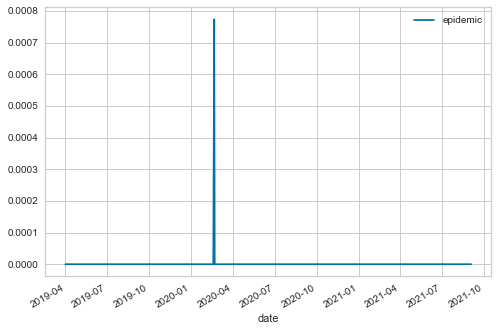

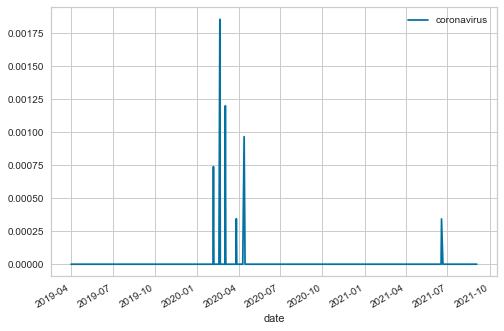

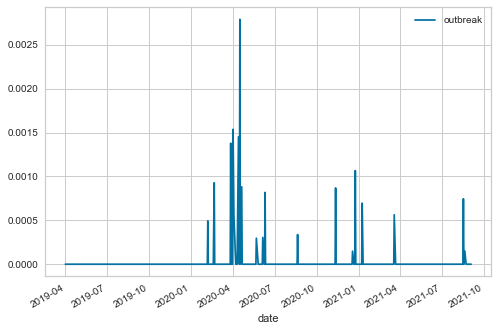

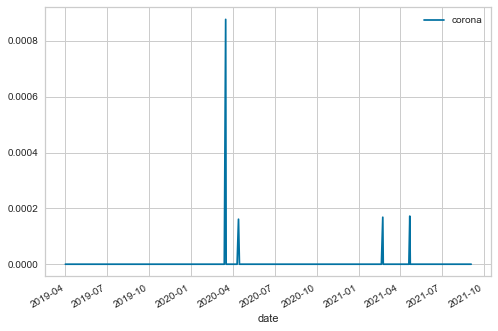

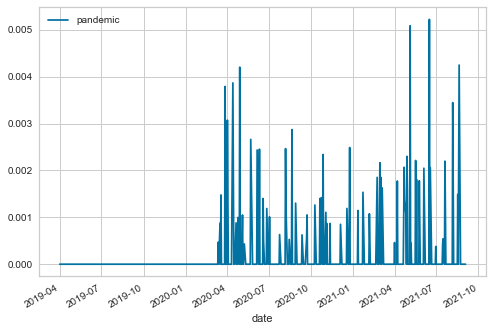

...

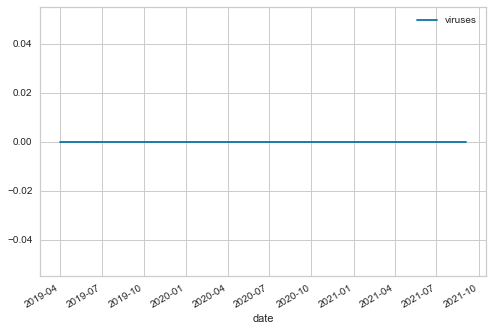

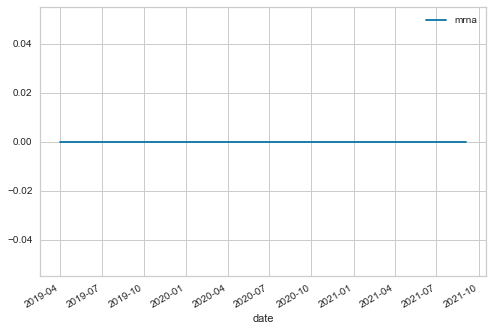

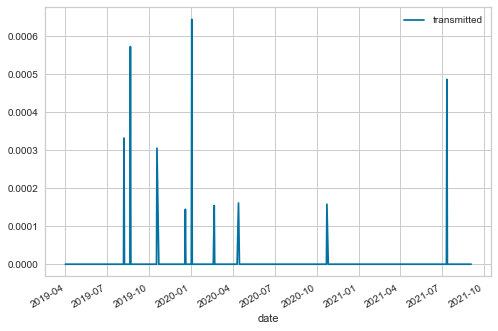

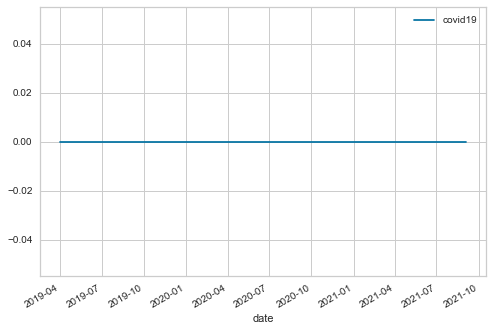

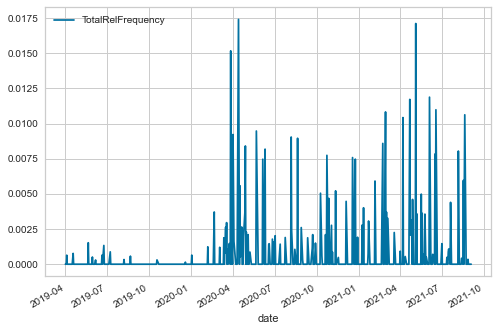

In [45]:
for i in range(1,37,1):
    FreqTable[FreqTable.columns[[i]]].plot(kind='line')

figure, axis = plt.subplots(3,2,figsize=(20,22))

for word in c_lex[0:6] :
    axis[0,0].plot(FreqTable['date'],FreqTable[word])
    axis[0,0].set_xticklabels(FreqTable['date'], rotation=90)
axis[0,0].legend(c_lex[0:6])

for word in c_lex[6:12] :
    axis[0,1].plot(FreqTable['date'],FreqTable[word])
    axis[0,1].set_xticklabels(FreqTable['date'], rotation=90)
axis[0,1].legend(c_lex[6:12])

for word in c_lex[12:18] :
    axis[1,0].plot(FreqTable['date'],FreqTable[word])
    axis[1,0].set_xticklabels(FreqTable['date'], rotation=90)
axis[1,0].legend(c_lex[12:18])

for word in c_lex[18:24] :
    axis[1,1].plot(FreqTable['date'],FreqTable[word])
    axis[1,1].set_xticklabels(FreqTable['date'], rotation=90)
axis[1,1].legend(c_lex[18:24])

for word in c_lex[24:30] :
    axis[2,0].plot(FreqTable['date'],FreqTable[word])
    axis[2,0].set_xticklabels(FreqTable['date'], rotation=90)
axis[2,0].legend(c_lex[24:30])

for word in c_lex[30:35] :
    axis[2,1].plot(FreqTable['date'],FreqTable[word])
    axis[2,1].set_xticklabels(FreqTable['date'], rotation=90)
axis[2,1].legend(c_lex[30:35])


# Covid Data:

In [65]:
covid_data = pd.read_csv('owid-covid-data.csv')
covid_new = covid_data[["iso_code",'date','new_cases','new_cases_smoothed']]
covid_ind = covid_new[covid_new["iso_code"] == 'IND']

In [66]:
covid_ind.index = pd.to_datetime(covid_ind['date'])

In [67]:
covid_ind = covid_ind.drop(['date','iso_code'],axis=1)

In [68]:
rolling_mean_case = FreqTable.TotalRelFrequency.rolling(window=3).mean()
rolling_mean_cov = covid_ind.new_cases.rolling(window=3).mean()

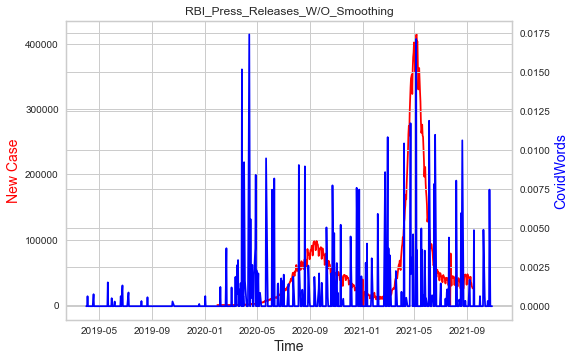

In [69]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# make a plot
ax.plot(covid_ind.new_cases, color="red")
# set x-axis label
ax.set_xlabel("Time",fontsize=14)
# set y-axis label
ax.set_ylabel("New Case",color="red",fontsize=14)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(FreqTable.TotalRelFrequency,color="blue")
ax2.set_ylabel("CovidWords",color="blue",fontsize=14)
plt.title('RBI_Press_Releases_W/O_Smoothing')
plt.show()

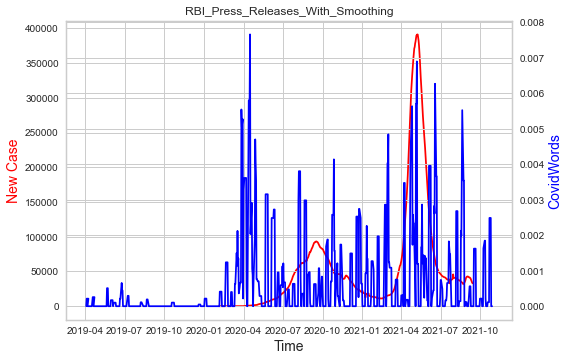

In [70]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# make a plot
ax.plot(covid_ind.new_cases_smoothed, color="red")
# set x-axis label
ax.set_xlabel("Time",fontsize=14)
# set y-axis label
ax.set_ylabel("New Case",color="red",fontsize=14)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(rolling_mean_case,color="blue")
ax2.set_ylabel("CovidWords",color="blue",fontsize=14)
plt.title('RBI_Press_Releases_With_Smoothing')
plt.show()

# Sentiment Score

In [71]:
score_press_release = rbi_press_release[['date','content_clean','content_tokenized','w/o_num_lemm']]

# Loughran_Polarity

In [72]:
score_press_release['Loughran_Polarity'] = "will be filled"
lm = ps.LM()

for i in range(0,len(score_press_release),1):
    tokens = lm.tokenize(score_press_release['content_clean'][i].lower())
    score = lm.get_score(tokens)
    score_press_release.loc[i,'Loughran_Polarity'] = score.get('Polarity')

<ipython-input-72-3713d8617c96>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['Loughran_Polarity'] = "will be filled"
<ipython-input-72-3713d8617c96>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'Loughran_Polarity'] = score.get('Polarity')


# Loughran_Subjectivity

In [73]:
score_press_release['Loughran_Subjectivity'] = "will be filled"
lm = ps.LM()

for i in range(0,len(score_press_release),1):
    tokens = lm.tokenize(score_press_release['content_clean'][i].lower())
    score = lm.get_score(tokens)
    score_press_release.loc[i,'Loughran_Subjectivity'] = score.get("Subjectivity")

<ipython-input-73-551e1b85c346>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['Loughran_Subjectivity'] = "will be filled"
<ipython-input-73-551e1b85c346>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'Loughran_Subjectivity'] = score.get("Subjectivity")


# NRC_Polarity

In [74]:
score_press_release['NRC_Polarity'] = "will be filled"
p1 = 0
n1 = 0

for i in range(0,len(score_press_release),1):
    
    for j in range(0,len(score_press_release['w/o_num_lemm'][i]),1):
        
        score = NRCLex(score_press_release['w/o_num_lemm'][i][j]).raw_emotion_scores
        
        p = score.get("positive")
        # print('pos :',p)
        if p == 1 :
            p1 = p1 + 1
        else :
            p1 = p1
        
        n = score.get("negative")
        # print('neg :',n)
        if n == 1 :
            n1 = n1 + 1
        else :
            n1 = n1
            
    if (p1 + n1) == 0 :
        score_press_release.loc[i,'NRC_Polarity'] = "Null"
        
    else :
        score_press_release.loc[i,'NRC_Polarity'] = (p1 - n1)/(p1 + n1)
    p1 = 0
    n1 = 0        

<ipython-input-74-b959648a58f0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['NRC_Polarity'] = "will be filled"
<ipython-input-74-b959648a58f0>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'NRC_Polarity'] = (p1 - n1)/(p1 + n1)
<ipython-input-74-b959648a58f0>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_releas

# Financial Stability Score

In [75]:
finstab = pd.read_excel('E:/NLP_PROJECT/Finstab.xlsx')

In [76]:
finstab_set_pos = {word for word in finstab.loc[finstab['Positive'] == 1]['Word']}

In [77]:
finstab_set_neg = {word for word in finstab.loc[finstab['Negative'] == 1]['Word']}

In [78]:
score_press_release['Financial_Stab_Score'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release),1):
    
    for j in range(0,len(score_press_release['w/o_num_lemm'][i]),1):
        
        set_word = {word for word in score_press_release['w/o_num_lemm'][i]}
        pos_set = finstab_set_pos.intersection(set_word)
        neg_set = finstab_set_neg.intersection(set_word)
        p = len(pos_set)
        n = len(neg_set)
      
    if (p + n) == 0 :
        score_press_release.loc[i,'Financial_Stab_Score'] = "Null"
        
    else :
        score_press_release.loc[i,'Financial_Stab_Score'] = (p - n)/(p + n)
    # print("Row No:",i)

<ipython-input-78-84dc17fc55fe>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['Financial_Stab_Score'] = "will be filled"
<ipython-input-78-84dc17fc55fe>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'Financial_Stab_Score'] = "Null"
<ipython-input-78-84dc17fc55fe>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_rel

# Sentiword Score

In [79]:
score_press_release['Sentiword_Score'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release),1):
    text = score_press_release['w/o_num_lemm'][i]
    tagged_sent = pos_tag(text)
    store_it = [(word, map_tag('en-ptb', 'universal', tag)) for word, tag in tagged_sent]
    
    for word,tag in store_it:
        
        if(tag=='NOUN'):
            tag='n'
        elif(tag=='VERB'):
            tag='v'
        elif(tag=='ADJ'):
            tag='a'
        elif(tag=='ADV'):
            tag ='r'
        else:
            tag='nothing'
    
        concat = word+'.'+tag+'.01'
    
        try:
            p1 = swn.senti_synset(concat).pos_score()
            n1 = swn.senti_synset(concat).neg_score()
        except:
            print('Null')
            
        p = p + p1
        n = n + n1
    
    if (p + n) == 0 :
        score_press_release.loc[i,'Sentiword_Score'] = "Null"
        
    else :
        score_press_release.loc[i,'Sentiword_Score'] = ((p - n)/(p + n))
    p = 0
    n = 0

<ipython-input-79-65c71ca708b2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['Sentiword_Score'] = "will be filled"


Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null


<ipython-input-79-65c71ca708b2>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'Sentiword_Score'] = ((p - n)/(p + n))


Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null


# Hu & Liu Score

In [80]:
huliu = pd.read_csv('E:/NLP_PROJECT/huliu.csv')

In [81]:
huliu_set_pos = {word for word in huliu.loc[huliu['y'] == 1]['x']}

In [82]:
huliu_set_neg = {word for word in huliu.loc[huliu['y'] == -1]['x']}

In [83]:
score_press_release['Hu & Liu Polarity'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release),1):
    
    for j in range(0,len(score_press_release['w/o_num_lemm'][i]),1):
        
        set_word = {word for word in score_press_release['w/o_num_lemm'][i]}
        pos_set = huliu_set_pos.intersection(set_word)
        neg_set = huliu_set_neg.intersection(set_word)
        p = len(pos_set)
        n = len(neg_set)
    if (p + n) == 0 :
        score_press_release.loc[i,'Hu & Liu Polarity'] = "Null"
        
    else :
        score_press_release.loc[i,'Hu & Liu Polarity'] = (p - n)/(p + n)
    # print("Row No:",i)

<ipython-input-83-801387becd07>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release['Hu & Liu Polarity'] = "will be filled"
<ipython-input-83-801387becd07>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.loc[i,'Hu & Liu Polarity'] = "Null"
<ipython-input-83-801387becd07>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release.l

# Loughran Uncertainty

In [84]:
loughran = pd.read_csv('E:/NLP_PROJECT/loughran.csv')

In [85]:
loughran_word = {word for word in loughran['word']}

In [86]:
score_press_release['Loughran_Uncertainty'] = "will be filled"
p = 0

for i in range(0,len(score_press_release),1):
    for j in range(0,len(score_press_release['w/o_num_lemm'][i]),1):
        set_word = {word for word in score_press_release['w/o_num_lemm'][i]}
        set_total = loughran_word.intersection(set_word)
        p = len(set_total)
    
    score_press_release.loc[i,'Loughran_Uncertainty'] = (p)/(len(score_press_release['w/o_num_lemm'][i]))
    # print("Row No:",i)    

In [90]:
score_col = [0] + [i for i in range(4,11,1)]

In [92]:
score_press_release.index = pd.to_datetime(score_press_release['date'])

In [97]:
score_press_release_new = score_press_release[score_press_release["Financial_Stab_Score"] != "Null"]

In [101]:
score_press_release_new = score_press_release_new[score_press_release_new["Hu & Liu Polarity"] != "Null"]

In [98]:
score_press_release_new.index = pd.to_datetime(score_press_release_new['date'])

In [103]:
len(score_press_release_new)

1663

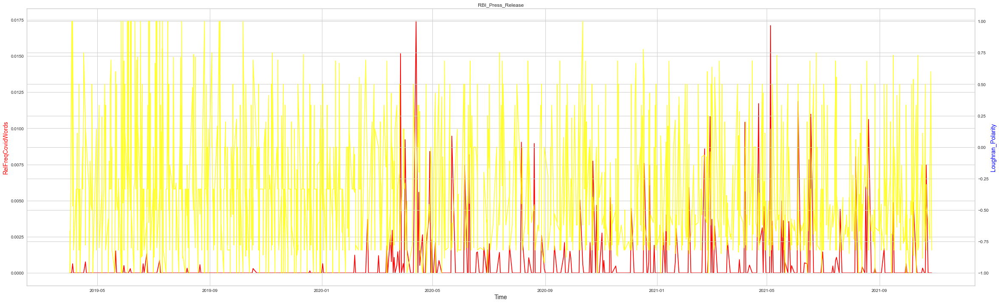

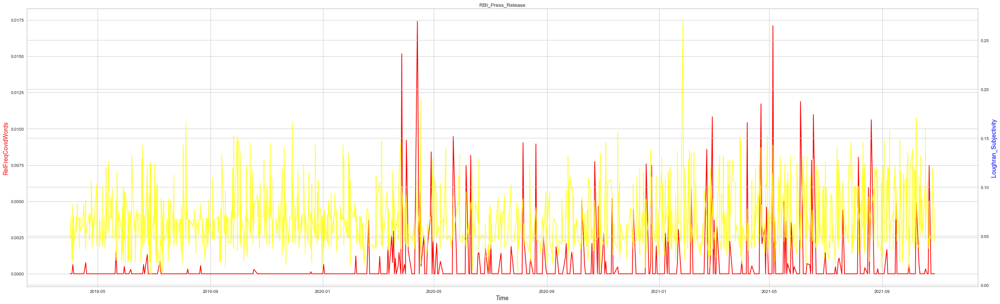

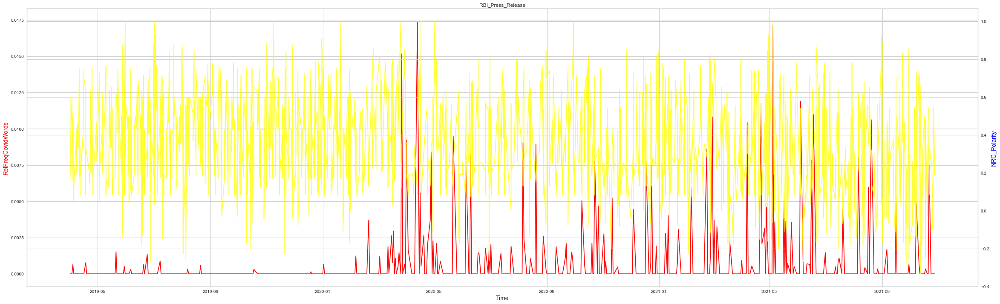

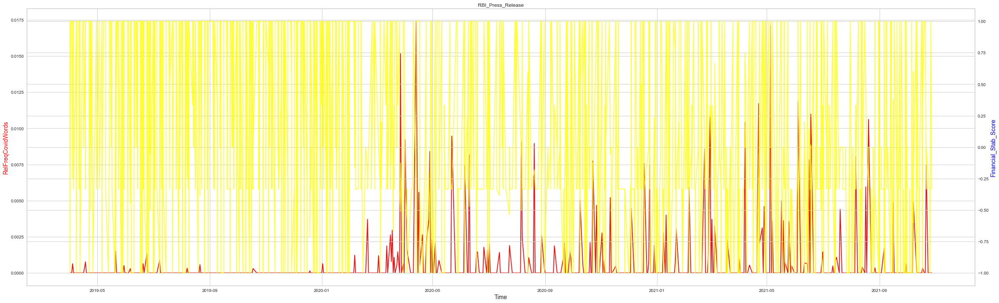

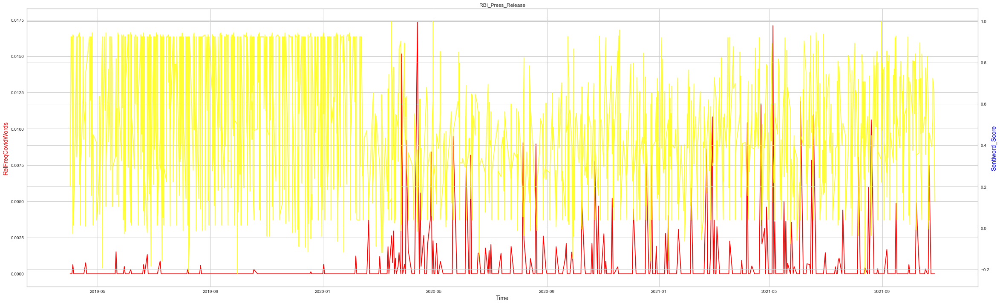

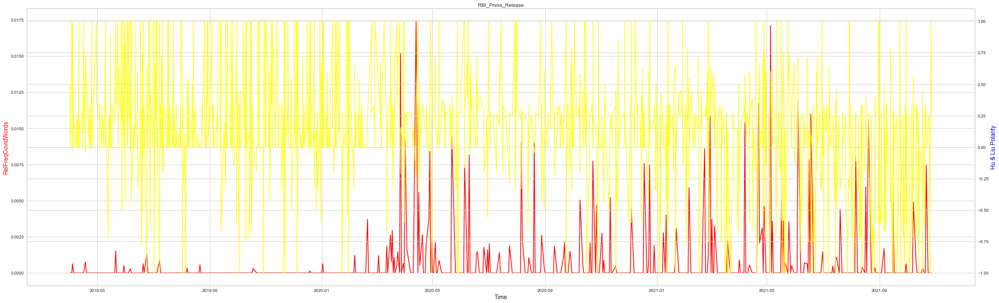

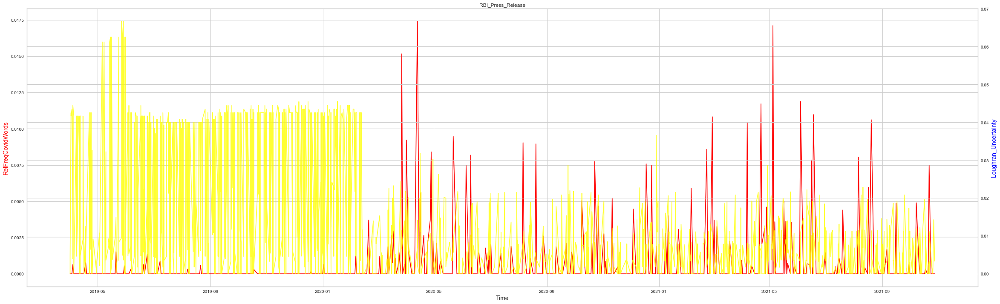

In [108]:
for i in range(4,11,1) :
    plt.rcParams['figure.figsize'] = 40, 12
    # create figure and axis objects with subplots()
    fig,ax = plt.subplots()
    # make a plot
    ax.plot(FreqTable.TotalRelFrequency, color="red")
    # set x-axis label
    ax.set_xlabel("Time",fontsize=14)
    # set y-axis label
    ax.set_ylabel("RelFreqCovidWords",color="red",fontsize=14)
    ax2=ax.twinx()
    # make a plot with different y-axis using second axis object
    ax2.plot(score_press_release_new[score_press_release_new.columns[[i]]],color="yellow",alpha=0.8)
    ax2.set_ylabel(score_press_release_new.columns[i],color="blue",fontsize=14)
    plt.title('RBI_Press_Release')
    a = score_press_release_new.columns[i]+'RBI_Press_Release'+".jpg"
    plt.savefig(a)
    plt.show()

In [62]:
score_press_release[score_press_release.columns[score_col]].to_csv('score_press_release.csv')

# Merging : 

In [158]:
score_press_release_merge = rbi_press_release[['date','content_clean']]

In [159]:
for i in range(0,len(score_press_release_merge),1):
    score_press_release_merge.loc[i,"date"] = score_press_release_merge['date'][i][2:5:]+str(",")+score_press_release_merge['date'][i][10:14:]

C:\Users\Arijit\anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
<ipython-input-159-fb4cd3b53cf6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release_merge.loc[i,"date"] = score_press_release_merge['date'][i][2:5:]+str(",")+score_press_release_merge['date'][i][10:14:]


In [160]:
score_press_release_merge['content_clean'] = score_press_release_merge.groupby(['date'])['content_clean'].transform(lambda x : ' '.join(x))
score_press_release_merge = score_press_release_merge.drop_duplicates()
score_press_release_merge = score_press_release_merge.reset_index(drop=True)

<ipython-input-160-922c123c3bfe>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_press_release_merge['content_clean'] = score_press_release_merge.groupby(['date'])['content_clean'].transform(lambda x : ' '.join(x))


In [161]:
score_press_release_merge['content_tokenized'] = score_press_release_merge['content_clean'].apply(lambda x: nltk.word_tokenize(x.lower()))

In [163]:
stopwords = nltk.corpus.stopwords.words('english')
def remove_stopwords(tokenized_list):
    text = [word for word in tokenized_list if word not in stopwords]
    return text

score_press_release_merge['content_tokenized'] = score_press_release_merge['content_tokenized'].apply(lambda x: remove_stopwords(x))

In [164]:
wn = nltk.WordNetLemmatizer()
def lemmatizing(tokenized_text):
    text = [wn.lemmatize(word) for word in tokenized_text]
    return text

score_press_release_merge['content_tokenized'] = score_press_release_merge['content_tokenized'].apply(lambda x: lemmatizing(x))

In [165]:
wolist = []
for i in range(0,len(score_press_release_merge),1) :
    
    for j in range(0,len(score_press_release_merge['content_tokenized'][i]),1) :
        
        text = score_press_release_merge['content_tokenized'][i][j]
        run = re.sub('[0-9]+', '', text)
        wolist.append(run)
    
    score_press_release_merge.loc[i,'content_tokenized'] = wolist
    wolist=[]

In [166]:
def short_remove_new(x):
    
    sh_list = []

    for j in range(0,len(score_press_release_merge),1) :
    
        for i in range(0,len(score_press_release_merge[x][j])) :
        
            if len(score_press_release_merge[x][j][i]) > 2:
            
                main = score_press_release_merge[x][j][i]
                sh_list.append(main)
    
        score_press_release_merge.loc[j,x] = sh_list
        sh_list=[]

In [167]:
short_remove_new('content_tokenized')

# Sentiment Score

# Loughran_Polarity

In [170]:
score_press_release_merge['Loughran_Polarity'] = "will be filled"
lm = ps.LM()

for i in range(0,len(score_press_release_merge),1):
    tokens = lm.tokenize(score_press_release_merge['content_clean'][i].lower())
    score = lm.get_score(tokens)
    score_press_release_merge.loc[i,'Loughran_Polarity'] = score.get('Polarity')

# Loughran_Subjectivity

In [171]:
score_press_release_merge['Loughran_Subjectivity'] = "will be filled"
lm = ps.LM()

for i in range(0,len(score_press_release_merge),1):
    tokens = lm.tokenize(score_press_release_merge['content_clean'][i].lower())
    score = lm.get_score(tokens)
    score_press_release_merge.loc[i,'Loughran_Subjectivity'] = score.get("Subjectivity")

# NRC_Polarity

In [172]:
score_press_release_merge['NRC_Polarity'] = "will be filled"
p1 = 0
n1 = 0

for i in range(0,len(score_press_release_merge),1):
    
    for j in range(0,len(score_press_release_merge['content_tokenized'][i]),1):
        
        score = NRCLex(score_press_release_merge['content_tokenized'][i][j]).raw_emotion_scores
        
        p = score.get("positive")
        # print('pos :',p)
        if p == 1 :
            p1 = p1 + 1
        else :
            p1 = p1
        
        n = score.get("negative")
        # print('neg :',n)
        if n == 1 :
            n1 = n1 + 1
        else :
            n1 = n1
            
    if (p1 + n1) == 0 :
        score_press_release_merge.loc[i,'NRC_Polarity'] = "Null"
        
    else :
        score_press_release_merge.loc[i,'NRC_Polarity'] = (p1 - n1)/(p1 + n1)
    p1 = 0
    n1 = 0        

# Financial Stability Score

In [173]:
finstab = pd.read_excel('E:/NLP_PROJECT/Finstab.xlsx')

In [174]:
finstab_set_pos = {word for word in finstab.loc[finstab['Positive'] == 1]['Word']}

In [175]:
finstab_set_neg = {word for word in finstab.loc[finstab['Negative'] == 1]['Word']}

In [176]:
score_press_release_merge['Financial_Stab_Score'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release_merge),1):
    
    for j in range(0,len(score_press_release_merge['content_tokenized'][i]),1):
        
        set_word = {word for word in score_press_release_merge['content_tokenized'][i]}
        pos_set = finstab_set_pos.intersection(set_word)
        neg_set = finstab_set_neg.intersection(set_word)
        p = len(pos_set)
        n = len(neg_set)
      
    if (p + n) == 0 :
        score_press_release_merge.loc[i,'Financial_Stab_Score'] = "Null"
        
    else :
        score_press_release_merge.loc[i,'Financial_Stab_Score'] = (p - n)/(p + n)
    # print("Row No:",i)

# Sentiword Score

In [177]:
score_press_release_merge['Sentiword_Score'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release_merge),1):
    text = score_press_release_merge['content_tokenized'][i]
    tagged_sent = pos_tag(text)
    store_it = [(word, map_tag('en-ptb', 'universal', tag)) for word, tag in tagged_sent]
    
    for word,tag in store_it:
        
        if(tag=='NOUN'):
            tag='n'
        elif(tag=='VERB'):
            tag='v'
        elif(tag=='ADJ'):
            tag='a'
        elif(tag=='ADV'):
            tag ='r'
        else:
            tag='nothing'
    
        concat = word+'.'+tag+'.01'
    
        try:
            p1 = swn.senti_synset(concat).pos_score()
            n1 = swn.senti_synset(concat).neg_score()
        except:
            print('Null')
            
        p = p + p1
        n = n + n1
    
    if (p + n) == 0 :
        score_press_release_merge.loc[i,'Sentiword_Score'] = "Null"
        
    else :
        score_press_release_merge.loc[i,'Sentiword_Score'] = ((p - n)/(p + n))
    p = 0
    n = 0

Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null
Null


# Hu & Liu Score

In [178]:
huliu = pd.read_csv('E:/NLP_PROJECT/huliu.csv')

In [179]:
huliu_set_pos = {word for word in huliu.loc[huliu['y'] == 1]['x']}

In [180]:
huliu_set_neg = {word for word in huliu.loc[huliu['y'] == -1]['x']}

In [181]:
score_press_release_merge['Hu & Liu Polarity'] = "will be filled"
p = 0
n = 0

for i in range(0,len(score_press_release_merge),1):
    
    for j in range(0,len(score_press_release_merge['content_tokenized'][i]),1):
        
        set_word = {word for word in score_press_release_merge['content_tokenized'][i]}
        pos_set = huliu_set_pos.intersection(set_word)
        neg_set = huliu_set_neg.intersection(set_word)
        p = len(pos_set)
        n = len(neg_set)
    if (p + n) == 0 :
        score_press_release_merge.loc[i,'Hu & Liu Polarity'] = "Null"
        
    else :
        score_press_release_merge.loc[i,'Hu & Liu Polarity'] = (p - n)/(p + n)
    # print("Row No:",i)

# Loughran Uncertainty

In [182]:
loughran = pd.read_csv('E:/NLP_PROJECT/loughran.csv')

In [183]:
loughran_word = {word for word in loughran['word']}

In [184]:
score_press_release_merge['Loughran_Uncertainty'] = "will be filled"
p = 0

for i in range(0,len(score_press_release_merge),1):
    for j in range(0,len(score_press_release_merge['content_tokenized'][i]),1):
        set_word = {word for word in score_press_release_merge['content_tokenized'][i]}
        set_total = loughran_word.intersection(set_word)
        p = len(set_total)
    
    score_press_release_merge.loc[i,'Loughran_Uncertainty'] = (p)/(len(score_press_release_merge['content_tokenized'][i]))
    # print("Row No:",i)    

In [186]:
score_press_release_merge.index = pd.to_datetime(score_press_release_merge['date'])

In [187]:
score_press_release_merge.to_csv('score_press_release_merge.csv')

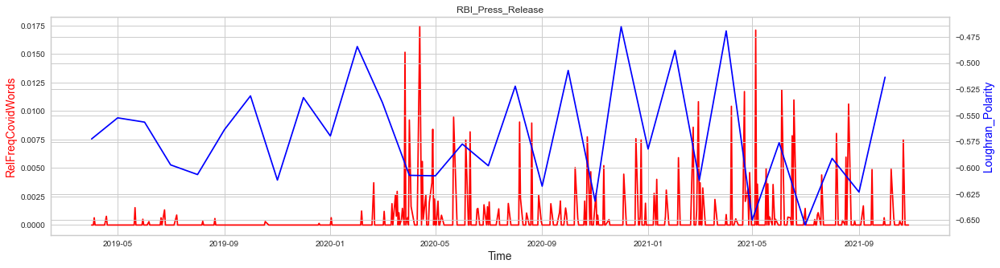

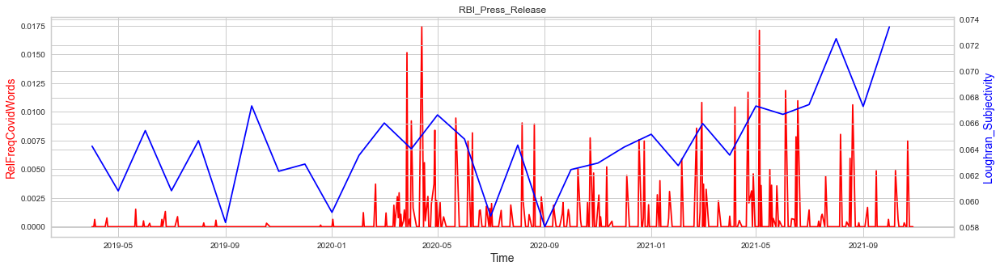

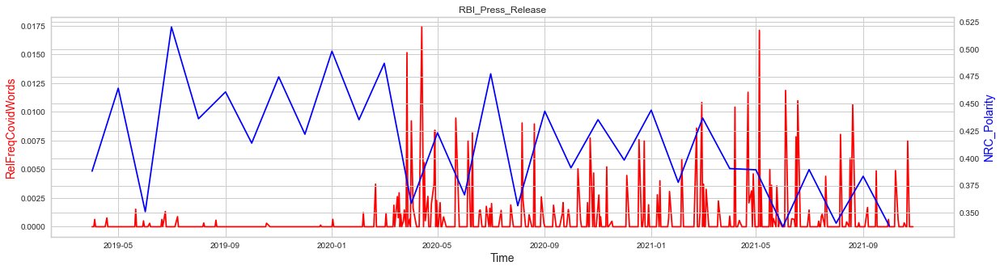

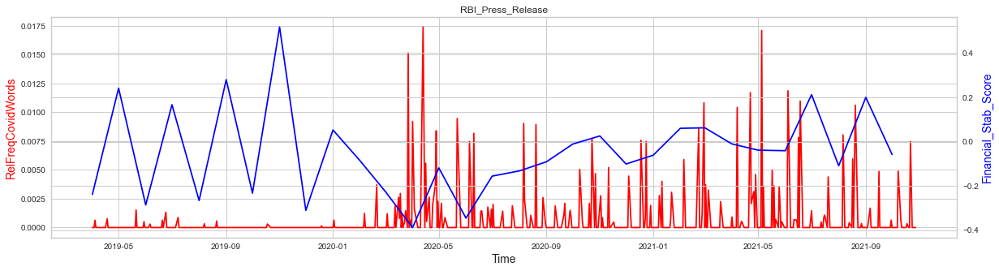

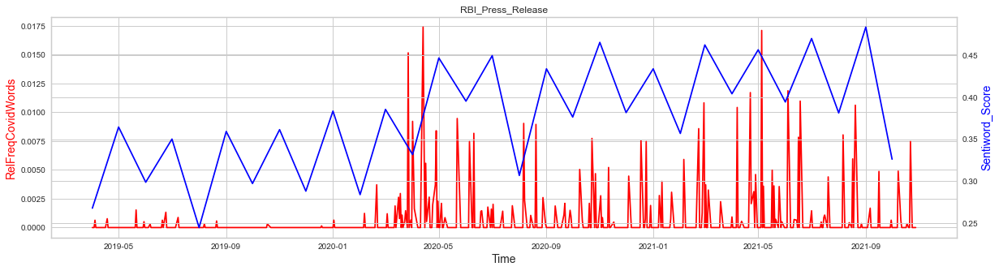

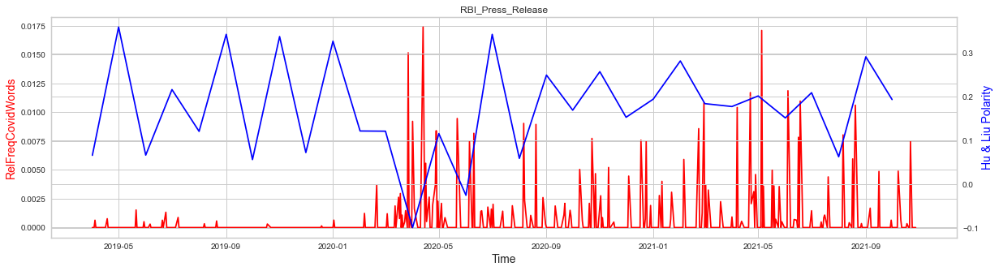

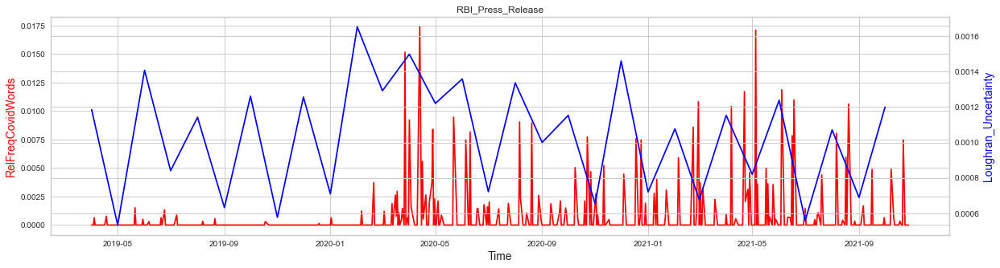

In [191]:
for i in range(3,10,1) :
    plt.rcParams['figure.figsize'] = 20, 5
    # create figure and axis objects with subplots()
    fig,ax = plt.subplots()
    # make a plot
    ax.plot(FreqTable.TotalRelFrequency, color="red")
    # set x-axis label
    ax.set_xlabel("Time",fontsize=14)
    # set y-axis label
    ax.set_ylabel("RelFreqCovidWords",color="red",fontsize=14)
    ax2=ax.twinx()
    # make a plot with different y-axis using second axis object
    ax2.plot(score_press_release_merge[score_press_release_merge.columns[[i]]],color="blue")
    ax2.set_ylabel(score_press_release_merge.columns[i],color="blue",fontsize=14)
    plt.title('RBI_Press_Release')
    a = score_press_release_merge.columns[i]+'RBI_Press_Release'+".jpg"
    plt.savefig(a)
    plt.show()